In [64]:
import pandas as pd
import numpy as np
import seaborn as sns


import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer


import spacy
from spacy.lang.en.stop_words import STOP_WORDS


from wordcloud import WordCloud

import string
import re
%matplotlib inline
pd.set_option('display.max_colwidth', 100)

In [65]:
nlp = spacy.load('en_core_web_sm')

In [66]:
tweet = pd.read_csv('covidvaccine.csv')

In [67]:
tweet.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,MyNewsNE,Assam,MyNewsNE a dedicated multi-lingual media house from North Eastern India.,24-05-2020 10:18,64,11,110,False,18-08-2020 12:55,Australia to Manufacture Covid-19 Vaccine and give it to the Citizens for free of cost: AFP quot...,['CovidVaccine'],Twitter Web App,False
1,Shubham Gupta,NaN,I will tell about all experiences of my life from my videos hope that you all like the videos 🙂,14-08-2020 16:42,1,17,0,False,18-08-2020 12:55,#CoronavirusVaccine #CoronaVaccine #CovidVaccine Australia is doing very good https://t.co/kBT7l...,"['CoronavirusVaccine', 'CoronaVaccine', 'CovidVaccine']",Twitter for Android,False
2,Journal of Infectiology,NaN,Journal of Infectiology (ISSN 2689-9981) is accepting submissions for an upcoming Volume 3 Issue...,14-12-2017 07:07,143,566,8,False,18-08-2020 12:46,Deaths due to COVID-19 in Affected Countries\nRead More: https://t.co/V8Y3Stu0UW\n@r_piryani @sh...,NaN,Twitter Web App,False
3,Zane,NaN,Fresher than you.,18-09-2019 11:01,29,25,620,False,18-08-2020 12:45,@Team_Subhashree @subhashreesotwe @iamrajchoco Stay safe @subhashreesotwe di &amp; @iamrajchoco ...,NaN,Twitter for Android,False
4,Ann-Maree O’Connor,"Adelaide, South Australia","Retired university administrator. Melburnian by birth, now living in Adelaide. Look back fondly ...",24-01-2013 14:53,83,497,10737,False,18-08-2020 12:45,@michellegrattan @ConversationEDU This is what passes for leadership in our country: a voucher f...,NaN,Twitter Web App,False


In [68]:
is_verified = tweet[tweet['user_verified']==True]

In [69]:
tweet.shape

(7186, 13)

In [70]:
print(f'Dataset columns: {tweet.columns}')

Dataset columns: Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')


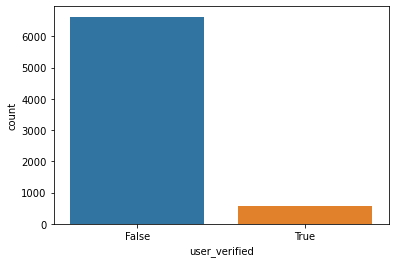

In [71]:
sns.countplot(x='user_verified', data= tweet)

In [72]:
x = tweet.text[0]

In [73]:
wordcloud = WordCloud(background_color='white').generate(x)

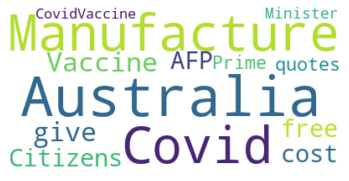

In [74]:
plt.axis('off')
plt.imshow(wordcloud , interpolation='bilinear')
plt.show()

In [75]:
verified_tweet = tweet[tweet['user_verified'] == True]

In [76]:
stopwords = list(STOP_WORDS)
punct = string.punctuation

In [77]:
def clean_tokens(text):
    text = re.sub('\W+' , ' ' , text)
    text = text.replace('https' , '')
    
    doc  = nlp(text)
    
    tokens =[]
    
    cleaned_text = []
    
    for token in doc:
        if token.lemma_ != '-PRON-':
            temp  =token.lemma_.lower().strip()
        else:
            temp  =token.lower_
        tokens.append(temp)
        
    for token in tokens:
        if token not in stopwords and token not in punct and len(token) > 4:
            cleaned_text.append(token)
            
    return cleaned_text

In [78]:
clean_tokens('i like apple /// ... m ajhfas asj //\nhttps:\\')

['apple', 'ajhfas']

In [80]:
verified_tweet = tweet['text'].apply(clean_tokens)

In [81]:
for tweet in verified_tweet:
    print(tweet)
    break

['australia', 'manufacture', 'covid', 'vaccine', 'citizens', 'quote', 'prime', 'minister', 'covidvaccine']


In [82]:
all_verified_tweet = []

for tweet in verified_tweet:
    all_verified_tweet+=tweet    

In [83]:
#now make wordcloud
#first make the list a string because wordcloud only takes string not a list

all_tweet= ' '.join(all_verified_tweet)

In [84]:
all_tweet

'australia manufacture covid vaccine citizens quote prime minister covidvaccine coronavirusvaccine coronavaccine covidvaccine australia kbt7l6pary death covid affect countries v8y3stu0uw r_piryani shitalbhandary 6jpmxx2kti team_subhashree subhashreesotwe iamrajchoco subhashreesotwe iamrajchoco ayhoaqm0ls michellegrattan conversationedu leadership country voucher ouub1peyij multi system inflammatory syndrome children covid19 atypical kawasaki disease covid19india 98wj2cekez privilrodrigues yatish57 deepkaranahuja shristi522 amrita33392520 rashmisriniva14 akashrk_88 sjanaqa vpla11fwfr msnbc qualify party vaccine minimally russia covidvaccine country ability vaccine locally force china qucozlb4ru chart vaccine episode odrayhi7zn pandemic covid19 covidvaccine biocon executive chairperson kiran mazumdar contract coronavirus inform twitter eojjwpsw11 covid19millionares covid19 corona covidvaccine great pfizer vaccine enter phase trial pdqjlj3cvz pharmaceutical ogz2impdwp dangerous covidvacci

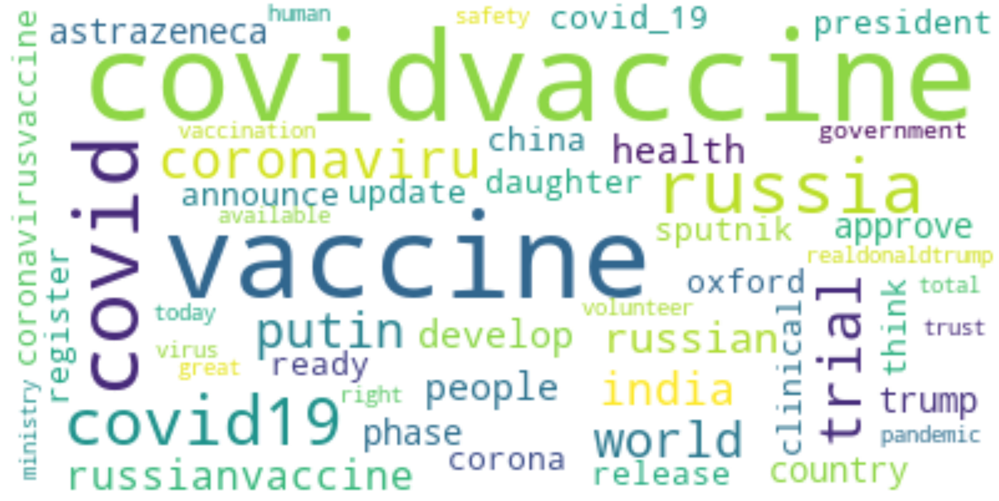

In [85]:
fig , ax = plt.subplots(figsize=(100,100))
wordcloud_all = WordCloud(max_font_size=50, max_words=50, background_color="white" , collocations = False).generate(all_tweet)

plt.imshow(wordcloud_all , interpolation='bilinear')
plt.axis('off')
plt.show()

# TOP user tweets

In [86]:
is_verified['user_name'].value_counts()[:10]

IndiaToday             37
moneycontrol           36
Phil News Agency       23
DT Next                19
The Tribune            19
IANS Tweets            16
ETHealthWorld          14
Bhekisisa              14
The Peninsula Qatar     9
OTV                     9
Name: user_name, dtype: int64

In [87]:
india_today = is_verified[is_verified['user_name']=='IndiaToday']

In [88]:
india_today.shape

(37, 13)

In [89]:
#change into tokens

india_today_tweet = india_today['text'].apply(clean_tokens)

In [91]:
all_india_today_tweet = []

for tweet in india_today_tweet:
    all_india_today_tweet += tweet

In [92]:
cleaned_india_today_tweet = ' '.join(all_india_today_tweet)

In [93]:
cleaned_india_today_tweet

'diligent phase trial vaccinate people moderate w2qx5ckp53 science human response vaccine sustainab ke0co1ldv1 silver bullet action doctor author du9a3ohlar diligent phase trial vaccinate people moderate dtdhcrgmz4 india covid19 vaccine report poojashali milan_report coronavirus vfqwes9kiy scientist moscow national prestige safety russia covidvaccine klyt5g1gje scientist moscow national prestige safety russia covidvaccine 8blkebsuo4 russia decision grant approval complete trial raise concern expert iagph6bglz health ministry level expert panel discuss creation digital infrastructure inventory manag f9agrk43mn factcheck daniel salmon director institute vaccine safety johns hopkins university joe78mnq0r moscow develop world vaccine offer sustainable immunity virus iezrnmsv5q sputnikv receive approval domestic regulator president vladimir putin offici gdt9abqq2 vaccine offer elderly effective bring morbidity mortality phseeikqwq sputnikv receive approval domestic regulator president vladi

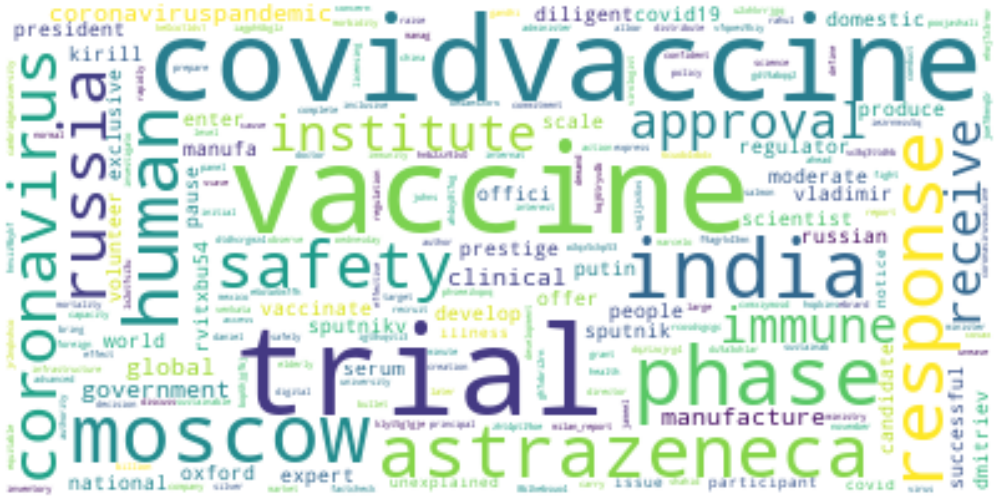

In [96]:
fig , ax = plt.subplots(figsize=(100,100))
wordcloud = WordCloud(max_font_size=50 , background_color='white').generate(cleaned_india_today_tweet)
plt.axis('off')
plt.imshow(wordcloud , interpolation='bilinear')
plt.show()

In [97]:
all_tweet

'australia manufacture covid vaccine citizens quote prime minister covidvaccine coronavirusvaccine coronavaccine covidvaccine australia kbt7l6pary death covid affect countries v8y3stu0uw r_piryani shitalbhandary 6jpmxx2kti team_subhashree subhashreesotwe iamrajchoco subhashreesotwe iamrajchoco ayhoaqm0ls michellegrattan conversationedu leadership country voucher ouub1peyij multi system inflammatory syndrome children covid19 atypical kawasaki disease covid19india 98wj2cekez privilrodrigues yatish57 deepkaranahuja shristi522 amrita33392520 rashmisriniva14 akashrk_88 sjanaqa vpla11fwfr msnbc qualify party vaccine minimally russia covidvaccine country ability vaccine locally force china qucozlb4ru chart vaccine episode odrayhi7zn pandemic covid19 covidvaccine biocon executive chairperson kiran mazumdar contract coronavirus inform twitter eojjwpsw11 covid19millionares covid19 corona covidvaccine great pfizer vaccine enter phase trial pdqjlj3cvz pharmaceutical ogz2impdwp dangerous covidvacci

In [98]:
from collections import Counter

In [99]:
Counter(all_tweet.split(' ')).most_common()

[('covidvaccine', 3621),
 ('vaccine', 3117),
 ('covid', 1591),
 ('russia', 1171),
 ('covid19', 924),
 ('trial', 644),
 ('coronavirus', 569),
 ('world', 554),
 ('putin', 532),
 ('india', 410),
 ('russian', 347),
 ('russianvaccine', 308),
 ('people', 262),
 ('develop', 255),
 ('health', 245),
 ('phase', 227),
 ('approve', 225),
 ('astrazeneca', 224),
 ('country', 222),
 ('trump', 215),
 ('corona', 186),
 ('covid_19', 179),
 ('coronavirusvaccine', 175),
 ('announce', 172),
 ('sputnik', 164),
 ('oxford', 161),
 ('president', 157),
 ('china', 145),
 ('daughter', 144),
 ('ready', 142),
 ('release', 137),
 ('clinical', 135),
 ('register', 135),
 ('think', 132),
 ('update', 128),
 ('realdonaldtrump', 121),
 ('government', 121),
 ('today', 120),
 ('total', 114),
 ('safety', 112),
 ('virus', 110),
 ('volunteer', 109),
 ('trust', 108),
 ('available', 108),
 ('pandemic', 107),
 ('right', 107),
 ('ministry', 104),
 ('great', 102),
 ('vaccination', 100),
 ('human', 99),
 ('development', 91),
 ('vacc

In [102]:
Counter(cleaned_india_today_tweet.split(' ')).most_common()

[('trial', 15),
 ('vaccine', 15),
 ('covidvaccine', 13),
 ('phase', 5),
 ('india', 5),
 ('moscow', 5),
 ('human', 4),
 ('response', 4),
 ('astrazeneca', 4),
 ('coronavirus', 3),
 ('safety', 3),
 ('russia', 3),
 ('approval', 3),
 ('institute', 3),
 ('receive', 3),
 ('immune', 3),
 ('coronaviruspandemic', 3),
 ('clinical', 3),
 ('manufacture', 3),
 ('global', 3),
 ('government', 3),
 ('diligent', 2),
 ('vaccinate', 2),
 ('people', 2),
 ('moderate', 2),
 ('covid19', 2),
 ('scientist', 2),
 ('national', 2),
 ('prestige', 2),
 ('expert', 2),
 ('develop', 2),
 ('world', 2),
 ('offer', 2),
 ('sputnikv', 2),
 ('domestic', 2),
 ('regulator', 2),
 ('president', 2),
 ('vladimir', 2),
 ('putin', 2),
 ('offici', 2),
 ('scale', 2),
 ('oxford', 2),
 ('produce', 2),
 ('rvitxbu54', 2),
 ('serum', 2),
 ('enter', 2),
 ('manufa', 2),
 ('exclusive', 2),
 ('sputnik', 2),
 ('kirill', 2),
 ('dmitriev', 2),
 ('russian', 2),
 ('successful', 2),
 ('volunteer', 2),
 ('pause', 2),
 ('candidate', 2),
 ('unexplained

In [103]:
plt.figure(figsize=(20, 10))
sns.set_style('white')
sns.countplot(x='user_name', data=tweet )
plt.xticks(rotation = 90)
plt.title("Distributions of Number of Companies' Replies ", fontsize = 20)
plt.show()

AttributeError: 'list' object has no attribute 'get'

<Figure size 1440x720 with 0 Axes>